# Self-Driving Car Engineer Nanodegree


## Project: **Camera Calibration** 

## Import Packages

In [2]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import glob
import pickle

from helper_functions import undistortImage

%matplotlib inline

## Read in an Image

This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280, 3)


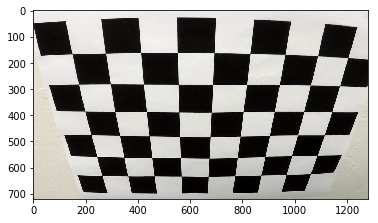

In [3]:
#reading in an image
image = mpimg.imread('camera_cal/calibration2.jpg')
image_shape_without_channel = (image.shape[0], image.shape[1])

#printing out some stats and plotting
print('This image is:', type(image), 'with dimensions:', image.shape)
plt.imshow(image)  # if you wanted to show a single color channel image called 'gray', for example, call as plt.imshow(gray, cmap='gray')

## Finding and drawing chessboard corners

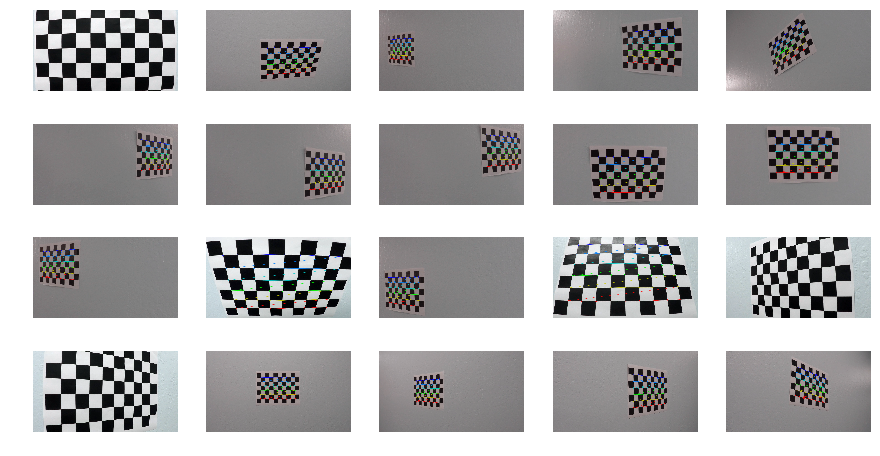

In [4]:
# Prepare object points
nx = 9 # Number of inside corners in x
ny = 6 # Number of inside corners in y

# Arrays tostore object points and image points from all the images
objpoints = [] # 3D points in real worl space
imgpoints = [] # 2D points in image plane

# Prepare object points, like (0,0,0), (1,0,0), (2,0,0), ..., (8,5,0)
objp = np.zeros((nx*ny,3), np.float32)
#print(objp)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2) # x, y coordinates
#print(objp)

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')
#print(images)
image_num = 0
fig = plt.figure(figsize=(15, 8))
for fname in images:
    # Read in each image
    img = cv2.imread(fname)
    image_num += 1
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    # If found, draw corners
    plt.subplot(4,5, image_num)
    if True == ret:
        imgpoints.append(corners)
        objpoints.append(objp)

        # Draw and display corners
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        plt.imshow(img)
    else: # Without else, there will be empty slot in the image plot
        plt.imshow(img)
    plt.axis('off')

## Calibrate the camera

In [6]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, image_shape_without_channel, None, None)

camera_params = [mtx, dist]
pickle.dump(camera_params, open("camera_params.pkl", "wb"))

## Testing: Undistort images



In [7]:
# Load the saved camera parameters
data = pickle.load(open("camera_params.pkl", "rb"))
camera_mtx = data[0]
camera_dist = data[1]

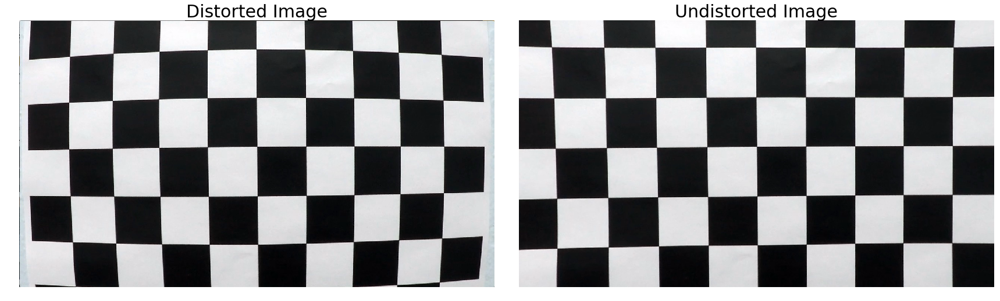

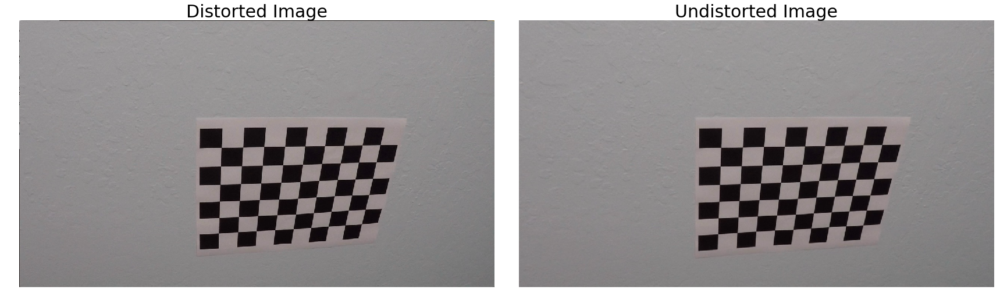

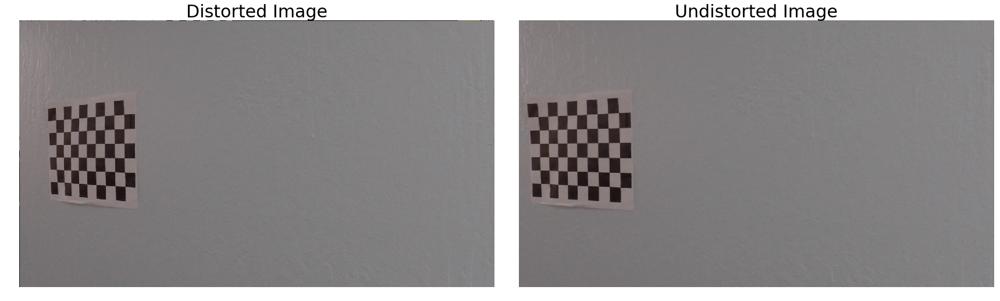

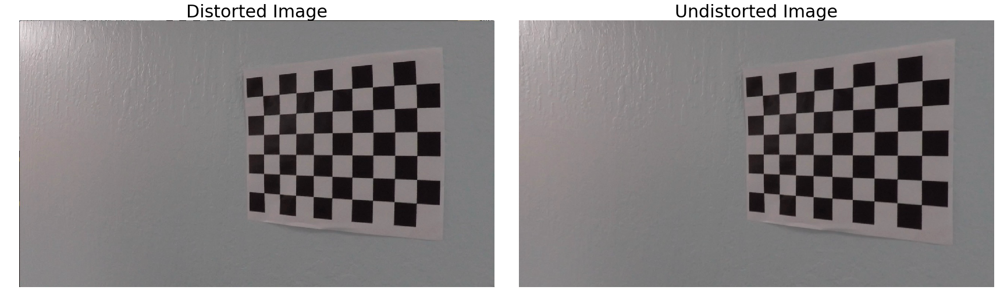

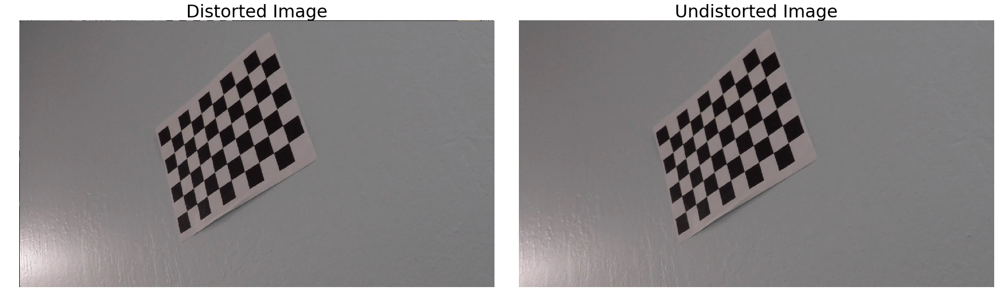

...

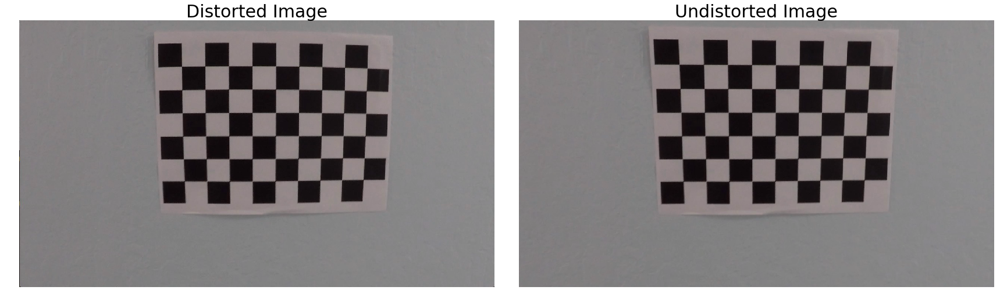

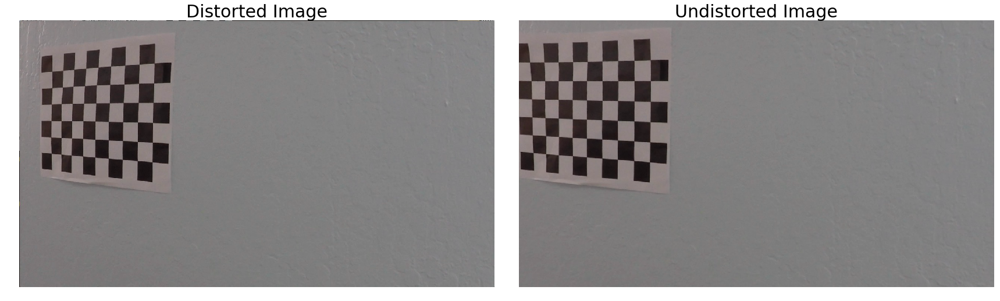

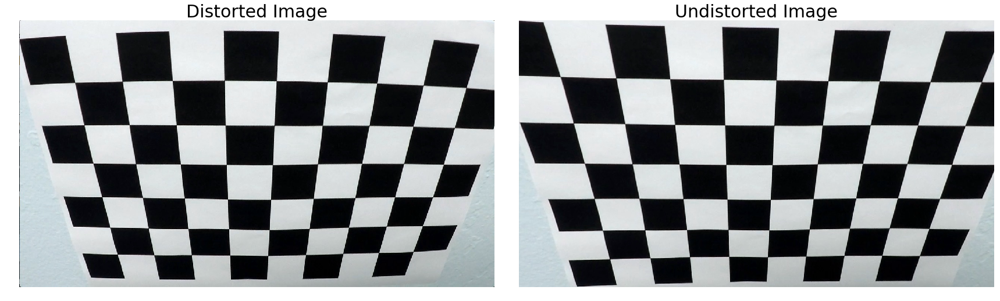

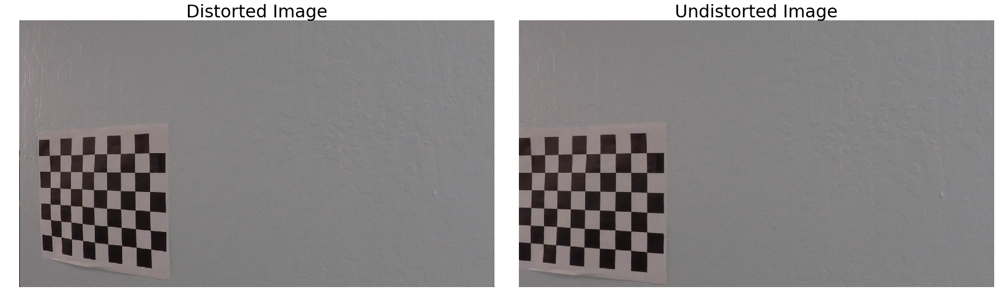

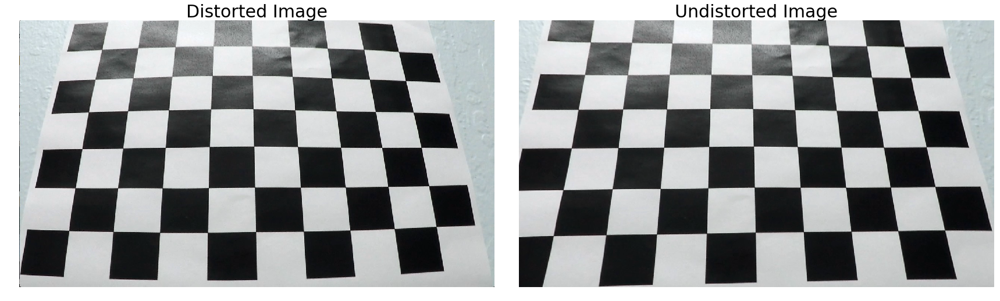

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


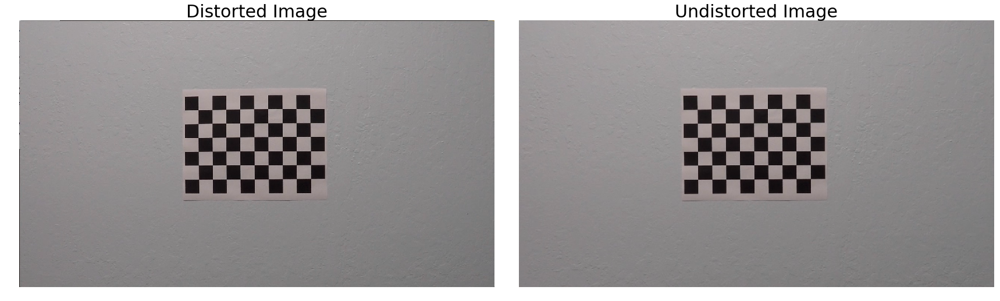

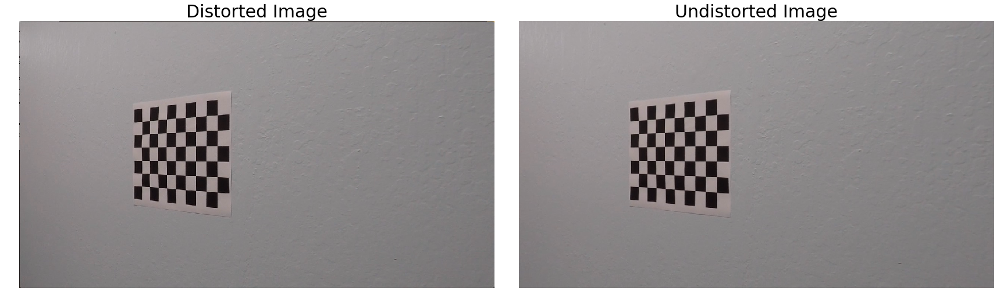

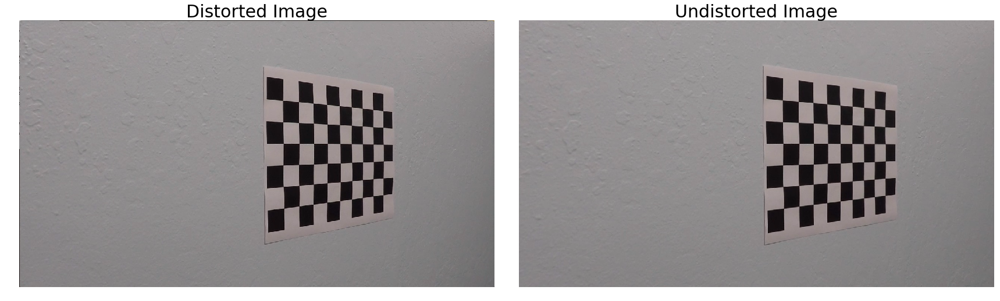

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [33]:
# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')
#print(images[1])
for fname in images:    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    
    # Read in each image
    img = cv2.imread(fname)
    ax1.imshow(img)  
    ax1.set_title('Distorted Image', fontsize=30)
    ax1.axis('off')
        
    # undistort the image
    undistorted = undistortImage(img, camera_mtx, camera_dist)
    ax2.imshow(undistorted)  
    ax2.set_title('Undistorted Image', fontsize=30)  
    ax2.axis('off')